In [1]:
import pandas as pd
import numpy as np
from pymatgen.core import Composition
import re
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold
import numpy as np
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
import matplotlib as mpl
from sklearn.model_selection import train_test_split
import math
from joblib import Parallel, delayed
import warnings
warnings.filterwarnings('ignore')
from sklearn.metrics import accuracy_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score
from sklearn.model_selection import LeaveOneOut
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.feature_selection import SelectFromModel
from sklearn.model_selection import cross_val_score
from tqdm import tqdm
config = {
    "mathtext.fontset":'stix',
    "font.family":'serif',
    "font.serif": ['Arial'],
    "font.size": 24,
    'axes.unicode_minus': False 
}
plt.rcParams.update(config)
plt.rcParams['axes.unicode_minus'] = False  
large = 22; med = 16; small = 12
params = {'axes.titlesize': large,
          'legend.fontsize': med,
          'figure.figsize': (8, 6),
          'axes.labelsize': med,
          'axes.titlesize': med,
          'xtick.labelsize': med,
          'ytick.labelsize': med,
          'figure.titlesize': large}
plt.rcParams.update(params)
plt.rcParams['figure.dpi'] = 400
plt.rcParams['axes.grid'] = False

In [3]:
def init_population(n,c):
    return np.array([[math.ceil(e) for e in pop] for pop in (np.random.rand(n,c)-0.5)]), np.zeros((2,c))-1

def single_point_crossover(population):
    r,c, n = population.shape[0], population.shape[1], np.random.randint(1,population.shape[1])         
    for i in range(0,r,2):                
        population[i], population[i+1] = np.append(population[i][0:n],population[i+1][n:c]),np.append(population[i+1][0:n],population[i][n:c])        
    return population

def flip_mutation(population):
    return population.max() - population

def random_selection(population):
    r = population.shape[0]
    new_population = population.copy()    
    for i in range(r):        
        new_population[i] = population[np.random.randint(0,r)]
    return new_population
def predictive_model(X,y,model):
    X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,shuffle=True, random_state=42)
    mdl = model
    mdl.fit(X_train,y_train) 
    y_pred = mdl.predict(X_test)
    return r2_score(y_test, y_pred)
def get_fitness(data,feature_list,target,population,model):    
    fitness = []
    for i in range(population.shape[0]):    
        columns = [feature_list[j] for j in range(population.shape[1]) if population[i,j]==1]
        score = predictive_model(data[columns], data[target],model)
        fitness.append(score)                
    return fitness
def memorize(pop, memory):      
    return np.append(memory, pop.reshape(1,memory.shape[1]), axis=0)
def replace_duplicate(population, memory):    
    for i in range(population.shape[0]):         
        counter = 0                
        while any(np.all(memory == population[i], axis=1)) and (counter < 100): 
            population[i] = np.array([math.ceil(k) for k in (np.random.rand(population.shape[1])-0.5)])                    
            counter += 1                    
        memory = memorize(population[i], memory)   
    return population, memory

In [4]:
def ga(data, feature_list, target, n, max_iter,model):
    
    c = len(feature_list)
    
    population, memory = init_population(n,c)
    population, memory = replace_duplicate(population, memory)    
    
    fitness = get_fitness(data, feature_list, target, population,model)    
    
    optimal_value = max(fitness)
    optimal_solution = population[np.where(fitness==optimal_value)][0]    
    
    for i in range(max_iter): 
        start = time()
        population = random_selection(population)
        population = single_point_crossover(population)                        
        if np.random.rand() < 0.3:
            population = flip_mutation(population)   
        
        population, memory = replace_duplicate(population, memory)
                
        fitness = get_fitness(data, feature_list, target, population,model)
                
        if max(fitness) > optimal_value:
            optimal_value    = max(fitness)
            optimal_solution = population[np.where(fitness==optimal_value)][0]                               
        end = time()
        print(f"第 %d 次迭代T = %0.4f, optimize_value = %0.4f" % (i,end - start,optimal_value))
    return optimal_solution, optimal_value

In [5]:
def get_combined_features(data: pd.DataFrame):
    columns = data.columns
    A_features = []
    B_features = []
    O_features = []
    for column in columns:
        if str(column).__contains__('A'):
            A_features.append(column)
        elif str(column).__contains__('B'):
            B_features.append(column)
        elif str(column).__contains__('O'):
            O_features.append(column)

    for a_feature, b_feature, o_feature in zip(A_features, B_features, O_features):
        feature_name = str(a_feature).split('_')[1]
        feature_name = feature_name
        data['A-B_'+feature_name] = np.abs(data[a_feature] - data[b_feature])
        data['(A+B)-O_'+feature_name] = np.abs((data[a_feature] + data[b_feature])- data[o_feature])


    data = data.drop(columns=O_features)
    return data

In [ ]:
base_metal_oxide = pd.read_csv('/data/single_perovskite_oxide.csv')
base_metal_oxide = base_metal_oxide.drop(columns = 'Unnamed: 0').reset_index(drop=True)
base_metal_oxide = base_metal_oxide.drop(columns = 'composition').reset_index(drop=True)
base_metal_oxide['composition'] = base_metal_oxide['formula'].map(Composition)
y_eg_abo3 = base_metal_oxide['target']

In [7]:
# from matminer.featurizers.base import MultipleFeaturizer
# from matminer.featurizers import composition as cf
# from pymatgen.core import Composition
# feature_calculators = MultipleFeaturizer([cf.ElementProperty.from_preset("magpie"),
#                                           cf.ValenceOrbital(props=['avg']), cf.IonProperty(fast=True)])
# feature_labels = feature_calculators.feature_labels()
# small_dataset_features = feature_calculators.featurize_dataframe(base_metal_oxide,col_id='composition')
# small_dataset_features

In [ ]:
pysic_features_ABO3 = pd.read_csv('/data/pysic_features_ABO3.csv').drop(columns = 'Unnamed: 0')
pysic_labels = pysic_features_ABO3.columns.drop('formula')
pysic_labels

Index(['A_Density', 'B_Density', 'O_Density', 'A_dipole Polarizability',
       'B_dipole Polarizability', 'O_dipole Polarizability',
       'A_covalent Radius', 'B_covalent Radius', 'O_covalent Radius',
       'A_atomic Radius', 'B_atomic Radius', 'O_atomic Radius',
       'A_FirstIonization', 'B_FirstIonization', 'O_FirstIonization',
       'A_number of Valence Electrons', 'B_number of Valence Electrons',
       'O_number of Valence Electrons', 'A_number', 'B_number', 'O_number',
       'A_Period', 'B_Period', 'O_Period', 'A_Electronegativity',
       'B_Electronegativity', 'O_Electronegativity',
       'A_number of s+p Electrons', 'B_number of s+p Electrons',
       'O_number of s+p Electrons', 'A_number of d Electrons',
       'B_number of d Electrons', 'O_number of d Electrons', 'A_Mulliken EN',
       'B_Mulliken EN', 'O_Mulliken EN'],
      dtype='object')

In [6]:
pysic_features_ABO3 = pysic_features_ABO3[pysic_labels]
pysic_features_ABO3 = get_combined_features(pysic_features_ABO3)
pysic_features_ABO3

,A_Density,B_Density,A_dipole Polarizability,B_dipole Polarizability,A_covalent Radius,B_covalent Radius,A_atomic Radius,B_atomic Radius,A_FirstIonization,B_FirstIonization,...,A-B_Period,(A+B)-O_Period,A-B_Electronegativity,(A+B)-O_Electronegativity,A-B_number of s+p Electrons,(A+B)-O_number of s+p Electrons,A-B_number of d Electrons,(A+B)-O_number of d Electrons,A-B_Mulliken EN,(A+B)-O_Mulliken EN
0,7.520,7.15,192.0,83.00,172,122,1.85,1.40,544.5,652.9,...,2,8,0.49,0.61,1,3,5,5,0.62,0.72
1,2.990,8.86,97.0,55.00,148,111,1.60,1.35,633.1,760.4,...,0,6,0.52,0.20,0,2,6,8,0.96,0.10
2,7.900,7.15,158.0,83.00,169,122,1.80,1.40,593.4,652.9,...,2,8,0.46,0.58,1,3,4,6,0.62,0.72
3,4.470,7.15,162.0,83.00,163,122,1.80,1.40,600.0,652.9,...,1,7,0.44,0.56,1,3,4,6,0.53,0.63
4,6.150,7.87,215.0,62.00,180,116,1.95,1.40,538.1,762.5,...,2,8,0.73,0.51,0,2,5,7,0.96,0.38
5,7.520,8.86,192.0,55.00,172,111,1.85,1.35,544.5,760.4,...,2,8,0.71,0.39,0,2,7,7,1.20,0.14
6,4.470,7.87,162.0,62.00,163,116,1.80,1.40,600.0,762.5,...,1,7,0.61,0.39,0,2,5,7,0.87,0.29
7,6.150,7.15,215.0,83.00,180,122,1.95,1.40,538.1,652.9,...,2,8,0.56,0.68,1,3,4,6,0.62,0.72
8,6.770,7.15,216.0,83.00,176,122,1.85,1.40,527.0,652.9,...,2,8,0.53,0.65,1,3,5,5,0.62,0.72
9,7.010,7.15,208.0,83.00,174,122,1.85,1.40,533.1,652.9,...,2,8,0.52,0.64,1,3,5,5,0.62,0.72


In [ ]:
re_data = pd.read_csv('/data/all_features_df.csv')
ABO3_atomic_features = pd.read_csv('/data/small_atomic_features_new.csv').drop(columns = 'Unnamed: 0')
atomic_features = pd.read_csv('/data/ao_features.csv')

In [8]:
re_data

,formula,A1_x,A1_ratio_x,nA1_x,A2_x,A2_ratio_x,nA2_x,B1_x,B1_ratio_x,B2_x,...,B_atomic_ie_1,B_atomic_ie_2,B_atomic_ndunf,B_atomic_ndval,B_atomic_npunf,B_atomic_npval,B_atomic_nunf,B_atomic_nval,B_atomic_phi,B_atomic_pol
0,Sm0.2Sc0.8Cr1O3,Sm,0.2,3,Sc,0.8,3,Cr,1.0,Cr,...,6.766510,16.485700,5.0,5.0,0.0,0.0,6.0,6.0,4.650,11.600
1,Sm0.2Sc0.8Fe1O3,Sm,0.2,3,Sc,0.8,3,Fe,1.0,Fe,...,7.902400,16.187700,4.0,6.0,0.0,0.0,4.0,8.0,4.930,8.400
2,Sm0.2Zr1Sc0.8O3,Sm,0.2,3,Sc,0.8,3,Zr,1.0,Zr,...,6.633900,13.100000,8.0,2.0,0.0,0.0,8.0,4.0,3.450,17.900
3,Sm0.2Sc0.8Ge1O3,Sm,0.2,3,Sc,0.8,3,Ge,1.0,Ge,...,7.899430,15.934610,0.0,10.0,4.0,2.0,4.0,14.0,4.550,5.840
4,Sm0.2Hf1Sc0.8O3,Sm,0.2,3,Sc,0.8,3,Hf,1.0,Hf,...,6.825070,15.000000,8.0,2.0,0.0,0.0,8.0,18.0,3.600,16.200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35320,Sr1Ce0.7Zr0.3O3,Sr,1.0,2,Sr,0.0,2,Ce,0.7,Zr,...,5.867260,11.525000,8.7,1.3,0.0,0.0,17.8,4.0,3.261,26.090
35321,Sr1Ce0.7Be0.3O3,Sr,1.0,2,Sr,0.0,2,Ce,0.7,Be,...,6.673900,13.058342,6.3,0.7,0.0,0.0,15.4,3.4,3.741,22.400
35322,Sr1Ce0.7Ge0.3O3,Sr,1.0,2,Sr,0.0,2,Ce,0.7,Ge,...,6.246919,12.375383,6.3,3.7,1.2,0.6,16.6,7.0,3.591,22.472
35323,Sr1Ce0.7Hf0.3O3,Sr,1.0,2,Sr,0.0,2,Ce,0.7,Hf,...,5.924611,12.095000,8.7,1.3,0.0,0.0,17.8,8.2,3.306,25.580


In [9]:
atomic_labels = atomic_features.columns
select_atomic_labels = atomic_labels
atomic_features = atomic_features[select_atomic_labels]
atomic_features

,A_atomic_hfomo,A_atomic_hpomo,A_atomic_lfumo,A_atomic_lpumo,A_atomic_ea,A_atomic_ip,A_atomic_ea_by_half_charged_homo,A_atomic_ip_by_half_charged_homo,A_atomic_r_s_neg_1,A_atomic_r_val_neg_1,...,B_atomic_ie_1,B_atomic_ie_2,B_atomic_ndunf,B_atomic_ndval,B_atomic_npunf,B_atomic_npval,B_atomic_nunf,B_atomic_nval,B_atomic_phi,B_atomic_pol
0,-4.210348,-2.165658,-2.165658,-2.165658,-0.299291,4.230849,1.754248,6.900584,1.90799,0.81939,...,6.766510,16.485700,5.0,5.0,0.0,0.0,6.0,6.0,4.650,11.600
1,-4.210348,-2.165658,-2.165658,-2.165658,-0.299291,4.230849,1.754248,6.900584,1.90799,0.81939,...,7.881010,17.084000,3.0,7.0,0.0,0.0,3.0,9.0,5.100,7.500
2,-4.210348,-2.165658,-2.165658,-2.165658,-0.299291,4.230849,1.754248,6.900584,1.90799,0.81939,...,7.902400,16.187700,4.0,6.0,0.0,0.0,4.0,8.0,4.930,8.400
3,-4.210348,-2.165658,-2.165658,-2.165658,-0.299291,4.230849,1.754248,6.900584,1.90799,0.81939,...,6.758850,14.000000,6.0,4.0,0.0,0.0,7.0,5.0,4.050,15.700
4,-4.210348,-2.165658,-2.165658,-2.165658,-0.299291,4.230849,1.754248,6.900584,1.90799,0.81939,...,7.343920,14.632200,0.0,10.0,4.0,2.0,4.0,14.0,4.150,7.060
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72843,-3.709160,-3.709160,-0.900650,-0.900650,1.114753,5.960128,1.136460,5.964720,2.16695,2.26615,...,5.925526,11.667650,8.7,1.3,0.0,0.0,17.8,4.0,3.366,25.100
72844,-3.709160,-3.709160,-0.900650,-0.900650,1.114753,5.960128,1.136460,5.964720,2.16695,2.26615,...,5.676880,13.749545,6.3,3.7,1.5,0.3,16.9,6.7,3.456,23.156
72845,-3.709160,-3.709160,-0.900650,-0.900650,1.114753,5.960128,1.136460,5.964720,2.16695,2.26615,...,6.322594,12.498752,6.3,0.7,1.2,0.6,16.6,4.0,3.636,22.379
72846,-3.709160,-3.709160,-0.900650,-0.900650,1.114753,5.960128,1.136460,5.964720,2.16695,2.26615,...,6.141961,0.000000,8.4,1.6,0.0,0.0,17.5,8.5,3.441,24.650


In [10]:
def get_combined_features(data: pd.DataFrame):
    columns = data.columns
    A_features = []
    B_features = []
    O_features = []
    for column in columns:
        if str(column).__contains__('A'):
            A_features.append(column)
        elif str(column).__contains__('B'):
            B_features.append(column)
        elif str(column).__contains__('O'):
            O_features.append(column)

    for a_feature, b_feature, o_feature in zip(A_features, B_features, O_features):
        feature_name = str(a_feature).split('_')[1]
        feature_name = feature_name
        data['A-B_'+feature_name] = np.abs(data[a_feature] - data[b_feature])
        data['(A+B)-O_'+feature_name] = np.abs((data[a_feature] + data[b_feature])- data[o_feature])


    data = data.drop(columns=O_features)
    return data

In [11]:
pysic_features = re_data[pysic_labels]
pysic_features =  get_combined_features(pysic_features)
pysic_features[['formula','Eg']] = re_data[['formula','Eg']]
pysic_features

,A_Density,B_Density,A_dipole Polarizability,B_dipole Polarizability,A_covalent Radius,B_covalent Radius,A_atomic Radius,B_atomic Radius,A_FirstIonization,B_FirstIonization,...,A-B_Electronegativity,(A+B)-O_Electronegativity,A-B_number of s+p Electrons,(A+B)-O_number of s+p Electrons,A-B_number of d Electrons,(A+B)-O_number of d Electrons,A-B_Mulliken EN,(A+B)-O_Mulliken EN,formula,Eg
0,3.896,7.150,116.0,83.000,152.8,122.0,1.65,1.400,615.38,652.90,...,0.338,0.458,1.0,3.0,4.2,5.8,0.428,0.528,Sm0.2Sc0.8Cr1O3,2.146025
1,3.896,7.870,116.0,62.000,152.8,116.0,1.65,1.400,615.38,762.50,...,0.508,0.288,0.0,2.0,5.2,6.8,0.768,0.188,Sm0.2Sc0.8Fe1O3,1.374682
2,3.896,6.510,116.0,112.000,152.8,154.0,1.65,1.550,615.38,640.10,...,0.008,0.788,0.0,2.0,1.2,2.8,0.348,0.608,Sm0.2Zr1Sc0.8O3,4.177025
3,3.896,5.320,116.0,40.000,152.8,121.0,1.65,1.250,615.38,762.00,...,0.688,0.108,2.0,0.0,0.8,0.8,1.308,0.352,Sm0.2Sc0.8Ge1O3,3.941249
4,3.896,13.300,116.0,103.000,152.8,152.0,1.65,1.550,615.38,658.50,...,0.022,0.818,0.0,2.0,1.2,2.8,0.508,0.448,Sm0.2Hf1Sc0.8O3,4.529786
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35320,2.640,6.692,197.2,177.100,185.0,160.3,2.00,1.760,549.50,566.11,...,0.233,1.307,0.0,2.0,1.3,1.3,1.262,2.278,Sr1Ce0.7Zr0.3O3,3.843865
35321,2.640,5.294,197.2,154.822,185.0,144.7,2.00,1.610,549.50,643.93,...,0.305,1.235,0.0,2.0,0.7,0.7,1.640,1.900,Sr1Ce0.7Be0.3O3,3.431016
35322,2.640,6.335,197.2,155.500,185.0,150.4,2.00,1.670,549.50,602.68,...,0.437,1.103,0.6,1.4,0.7,0.7,1.550,1.990,Sr1Ce0.7Ge0.3O3,2.085930
35323,2.640,8.729,197.2,174.400,185.0,159.7,2.00,1.760,549.50,571.63,...,0.224,1.316,0.0,2.0,1.3,1.3,1.310,2.230,Sr1Ce0.7Hf0.3O3,3.646532


In [83]:
from scipy.stats import spearmanr
def remove_collinear_features(x, y,threshold):
    '''
    Objective:
        Remove collinear features in a dataframe with a correlation coefficient
        greater than the threshold. Removing collinear features can help a model
        to generalize and improves the interpretability of the model.
        
    Inputs: 
        threshold: any features with correlations greater than this value are removed
    
    Output: 
        dataframe that contains only the non-highly-collinear features
    '''  
    # Calculate the correlation matrix
    corr_matrix = x.corr()
    iters = range(len(corr_matrix.columns) - 1)
    drop_cols = []

    # Iterate through the correlation matrix and compare correlations
    for i in iters:
        for j in range(i):
            item = corr_matrix.iloc[j:(j+1), (i+1):(i+2)]
            col = item.columns
            row = item.index
            val = abs(item.values)
            
            # If correlation exceeds the threshold
            if val >= threshold:
                # Print the correlated features and the correlation value
#                 print(col.values[0], "|", row.values[0], "|", round(val[0][0], 2))
                x1 = x[col.values[0]]
                x2 = x[row.values[0]]
                corr1,p1 = spearmanr(x1, y)
                corr2,p2 = spearmanr(x2, y)
                if np.abs(corr1) < np.abs(corr2):
                    drop_cols.append(col.values[0])
                else:
                    drop_cols.append(row.values[0])
    # Drop one of each pair of correlated columns
    drops = set(drop_cols)
    x = x.drop(columns = drops)
    return x

# pysic features

In [84]:
feature_1 = pysic_features.copy(deep = True)
feature_1 = feature_1.drop_duplicates(subset='formula',keep='first').reset_index(drop = True)

In [85]:
y_eg = feature_1['Eg']
X_1 = feature_1
X_1 = X_1.drop(columns = ['formula','Eg'])
X_1 = remove_collinear_features(X_1,y_eg,0.8)
features_labels_1 = X_1.columns
X_1 = feature_1[features_labels_1]
X_1.columns

Index(['A_Density', 'B_Density', 'A_covalent Radius', 'B_atomic Radius',
       'B_FirstIonization', 'B_number of Valence Electrons',
       'A_number of s+p Electrons', 'B_number of s+p Electrons',
       'A_number of d Electrons', 'B_number of d Electrons', 'A-B_Density',
       '(A+B)-O_Density', 'A-B_atomic Radius', 'A-B_FirstIonization',
       'A-B_number of Valence Electrons',
       '(A+B)-O_number of Valence Electrons', 'A-B_Period', '(A+B)-O_Period',
       'A-B_Electronegativity', '(A+B)-O_Electronegativity',
       'A-B_number of s+p Electrons', '(A+B)-O_number of s+p Electrons',
       'A-B_number of d Electrons', '(A+B)-O_number of d Electrons',
       '(A+B)-O_Mulliken EN'],
      dtype='object')

# 补充原子轨道特征

In [86]:
pysic_best_feature = ['formula','Eg','A_Density','A_covalent Radius','B_atomic Radius','B_number of Valence Electrons',
                      'A_number of s+p Electrons','A_number of d Electrons','B_number of d Electrons',
                      'A-B_atomic Radius','A-B_number of Valence Electrons','(A+B)-O_number of d Electrons',
                      '(A+B)-O_Mulliken EN']
data_3 = pysic_features[pysic_best_feature].copy(deep = True)
data_3[select_atomic_labels] = re_data[select_atomic_labels]
data_3 = data_3.drop_duplicates(subset='formula',keep='first').reset_index(drop = True)

In [165]:
data_3

,formula,Eg,A_Density,A_covalent Radius,B_atomic Radius,B_number of Valence Electrons,A_number of s+p Electrons,A_number of d Electrons,B_number of d Electrons,A-B_atomic Radius,...,B_atomic_ie_1,B_atomic_ie_2,B_atomic_ndunf,B_atomic_ndval,B_atomic_npunf,B_atomic_npval,B_atomic_nunf,B_atomic_nval,B_atomic_phi,B_atomic_pol
0,Sm0.2Sc0.8Cr1O3,2.146025,3.896,152.8,1.400,6.0,2.0,0.8,5.0,0.250,...,6.766510,16.485700,5.0,5.0,0.0,0.0,6.0,6.0,4.650,11.600
1,Sm0.2Sc0.8Fe1O3,1.374682,3.896,152.8,1.400,8.0,2.0,0.8,6.0,0.250,...,7.902400,16.187700,4.0,6.0,0.0,0.0,4.0,8.0,4.930,8.400
2,Sm0.2Zr1Sc0.8O3,4.177025,3.896,152.8,1.550,4.0,2.0,0.8,2.0,0.100,...,6.633900,13.100000,8.0,2.0,0.0,0.0,8.0,4.0,3.450,17.900
3,Sm0.2Sc0.8Ge1O3,3.941249,3.896,152.8,1.250,4.0,2.0,0.8,0.0,0.400,...,7.899430,15.934610,0.0,10.0,4.0,2.0,4.0,14.0,4.550,5.840
4,Sm0.2Hf1Sc0.8O3,4.529786,3.896,152.8,1.550,4.0,2.0,0.8,2.0,0.100,...,6.825070,15.000000,8.0,2.0,0.0,0.0,8.0,18.0,3.600,16.200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35320,Sr1Ce0.7Zr0.3O3,3.843865,2.640,185.0,1.760,3.3,2.0,0.0,1.3,0.240,...,5.867260,11.525000,8.7,1.3,0.0,0.0,17.8,4.0,3.261,26.090
35321,Sr1Ce0.7Be0.3O3,3.431016,2.640,185.0,1.610,2.7,2.0,0.0,0.7,0.390,...,6.673900,13.058342,6.3,0.7,0.0,0.0,15.4,3.4,3.741,22.400
35322,Sr1Ce0.7Ge0.3O3,2.085930,2.640,185.0,1.670,3.3,2.0,0.0,0.7,0.330,...,6.246919,12.375383,6.3,3.7,1.2,0.6,16.6,7.0,3.591,22.472
35323,Sr1Ce0.7Hf0.3O3,3.646532,2.640,185.0,1.760,3.3,2.0,0.0,1.3,0.240,...,5.924611,12.095000,8.7,1.3,0.0,0.0,17.8,8.2,3.306,25.580


In [87]:
X_4 = data_3.copy(deep = True)
X_4 = X_4.drop(columns = ['formula','Eg'])
X_4 = remove_collinear_features(X_4,y_eg,0.8)
features_labels_4 = X_4.columns
X_4 = data_3[features_labels_4]
X_4.columns

Index(['A_covalent Radius', 'B_atomic Radius', 'B_number of Valence Electrons',
       'A_number of s+p Electrons', 'B_number of d Electrons',
       'A-B_atomic Radius', 'A-B_number of Valence Electrons',
       '(A+B)-O_number of d Electrons', '(A+B)-O_Mulliken EN',
       'A_atomic_hpomo', 'A_atomic_lfumo', 'A_atomic_lpumo', 'A_atomic_ea',
       'A_atomic_ip', 'A_atomic_r_val', 'A_atomic_r_s_1', 'A_atomic_r_d_1',
       'A_atomic_r_val_1', 'A_atomic_ie_2', 'A_atomic_ndval', 'A_atomic_nfunf',
       'A_atomic_nfval', 'A_atomic_nunf', 'A_atomic_nval', 'B_atomic_hfomo',
       'B_atomic_lfumo', 'B_atomic_lpumo', 'B_atomic_ip_by_half_charged_homo',
       'B_atomic_r_val_neg_1', 'B_atomic_r_val', 'B_atomic_r_val_05',
       'B_atomic_r_d_1', 'B_atomic_ie_2', 'B_atomic_ndval', 'B_atomic_npval',
       'B_atomic_nunf', 'B_atomic_nval', 'B_atomic_phi'],
      dtype='object')

In [22]:
X_GA = X_4.copy(deep = True)
X_GA['Eg'] = y_eg
df = X_GA
df

,A_covalent Radius,B_atomic Radius,B_number of Valence Electrons,A_number of s+p Electrons,B_number of d Electrons,A-B_atomic Radius,A-B_number of Valence Electrons,(A+B)-O_number of d Electrons,(A+B)-O_Mulliken EN,A_atomic_hpomo,...,B_atomic_r_val,B_atomic_r_val_05,B_atomic_r_d_1,B_atomic_ie_2,B_atomic_ndval,B_atomic_npval,B_atomic_nunf,B_atomic_nval,B_atomic_phi,Eg
0,152.8,1.400,6.0,2.0,5.0,0.250,3.0,5.8,0.528,-2.165658,...,0.44005,1.41305,0.44335,16.485700,5.0,0.0,6.0,6.0,4.650,2.146025
1,152.8,1.400,8.0,2.0,6.0,0.250,5.0,6.8,0.188,-2.165658,...,0.38735,0.39065,0.38895,16.187700,6.0,0.0,4.0,8.0,4.930,1.374682
2,152.8,1.550,4.0,2.0,2.0,0.100,1.0,2.8,0.608,-2.165658,...,0.85375,0.83435,0.82115,13.100000,2.0,0.0,8.0,4.0,3.450,4.177025
3,152.8,1.250,4.0,2.0,0.0,0.400,1.0,0.8,0.352,-2.165658,...,1.18975,1.14245,0.26635,15.934610,10.0,2.0,4.0,14.0,4.550,3.941249
4,152.8,1.550,4.0,2.0,2.0,0.100,1.0,2.8,0.448,-2.165658,...,0.90685,0.88435,0.86755,15.000000,2.0,0.0,8.0,18.0,3.600,4.529786
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35320,185.0,1.760,3.3,2.0,1.3,0.240,1.3,1.3,2.278,-3.709160,...,1.12409,1.64012,1.06461,11.525000,1.3,0.0,17.8,4.0,3.261,3.843865
35321,185.0,1.610,2.7,2.0,0.7,0.390,0.7,0.7,1.900,-3.709160,...,1.19216,1.70297,0.00000,13.058342,0.7,0.0,15.4,3.4,3.741,3.431016
35322,185.0,1.670,3.3,2.0,0.7,0.330,1.3,0.7,1.990,-3.709160,...,1.22489,1.73255,0.89817,12.375383,3.7,0.6,16.6,7.0,3.591,2.085930
35323,185.0,1.760,3.3,2.0,1.3,0.240,1.3,1.3,2.230,-3.709160,...,1.14002,1.65512,1.07853,12.095000,1.3,0.0,17.8,8.2,3.306,3.646532


In [ ]:
model_4 = ExtraTreesRegressor(n_jobs=-1,random_state=42)
target = 'Eg'
feature_list = [i for i in df.columns if i not in target]
# Execute Genetic Algorithm to obtain Important Feature
from time import time
start = time()
feature_set, optimize_r2_score = ga(df, feature_list, target, 10, 500,model_4)
feature_set = [feature_list[j] for j in range(len(feature_list)) if feature_set[j]==1]
end = time()
print(f"运行时间T = %0.4f" % (end - start))
print('Optimal Feature Set\n',feature_set,'\nOptimal Accuracy =', round(optimize_r2_score*100), '%')

第 0 次迭代T = 5.5722, optimize_value = 0.8499
第 1 次迭代T = 5.2543, optimize_value = 0.8560
第 2 次迭代T = 5.7189, optimize_value = 0.8560


In [12]:
# THE BEST FEATURE SET
feature_set=['B_number of Valence Electrons',
 '(A+B)-O_number of d Electrons',
 'B_atomic_hfomo',
 'B_atomic_lpumo',
 'B_atomic_r_val_neg_1',
 'A-B_number of Valence Electrons',
 'B_atomic Radius',
 'A_atomic_ndval',
 'A_atomic_nunf',
 'B_atomic_r_val_05',
 'B_atomic_ndval',
 'B_atomic_npval',
 'A_atomic_r_val',
 'A_atomic_nfunf',
 'A_atomic_r_val_1',
 'A_atomic_ea',
 'A-B_atomic Radius',
 'A_number of s+p Electrons',
 'A_atomic_nfval',
 'A_atomic_lfumo',
 'A_covalent Radius',
 'A_atomic_lpumo',
 'A_atomic_r_s_1',
 'A_atomic_hpomo',
 'A_atomic_r_d_1']

In [296]:
len(feature_set)

25

In [155]:
base_features_4 = pysic_features_ABO3.copy(deep = True)
base_features_4[select_atomic_labels] = ABO3_atomic_features[select_atomic_labels]

In [183]:
from sklearn.feature_selection import SelectFromModel
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from tqdm import tqdm
train_model = ExtraTreesRegressor(n_jobs=-1,random_state=42)
error1 = []
error2 = []
r2_prm = []
error1_base=[]
error2_base=[]
r2_prl=[]
train_set = []
test_set = []
tmp_df = pd.DataFrame()
kf = KFold(n_splits=5, shuffle=True, random_state=42)
cv_indices = kf.split(X_4,y_eg)
base_features_4 = base_features_4[feature_set]
for i,(train_index, test_index) in enumerate(cv_indices):
    train_set.append(train_index)
    test_set.append(test_index)
    X_train, X_test = X_4.loc[train_index], X_4.loc[test_index]
    y_train, y_test = y_eg.loc[train_index], y_eg.loc[test_index]
    X_train = X_train[feature_set]
    X_test = X_test[feature_set]
    name = f"fold_{i}"
    train_model.fit(X_train, y_train)
    
    y_pred = train_model.predict(X_test)
    mae_model = mean_absolute_error(y_test, y_pred)
    rmse_model = np.sqrt(mean_squared_error(y_test, y_pred))
    r2_model = r2_score(y_test,y_pred)
    error1.append(mae_model)
    error2.append(rmse_model)
    r2_prm.append(r2_model)
    
    y_base_4 = train_model.predict(base_features_4)
    tmp_df[f'column_{i}'] = y_base_4
    MAE_BASE_4 = mean_absolute_error(y_base_4,y_eg_abo3)
    RMSE_BASE_4 = np.sqrt(mean_squared_error(y_base_4,y_eg_abo3))
    R2_BASE_4 = r2_score(y_base_4,y_eg_abo3)
    error1_base.append(MAE_BASE_4)
    error2_base.append(RMSE_BASE_4)
    r2_prl.append(R2_BASE_4)
    print(name)
    print(f"Performance on the test set: MAE = %0.4f,RMSE = %0.4f, R2 = %0.4f" % (mae_model, rmse_model, r2_model))
    print(f"Performance on the small set: MAE = %0.4f,RMSE = %0.4f, R2 = %0.4f" % (MAE_BASE_4, RMSE_BASE_4, R2_BASE_4))
mean_error1 = sum(error1) / len(error1)
mean_error2 = sum(error2) / len(error2)
mean_r2 = sum(r2_prm) / len(r2_prm)
print('Performance on the test set using 5-fold: MAE = %0.4f' % mean_error1)
print('Performance on the test set using 5-fold: RMSE = %0.4f' % mean_error2)
print('Performance on the test set using 5-fold: R2 = %0.4f' % mean_r2)

mean_error1_base = sum(error1_base) / len(error1_base)
mean_error2_base = sum(error2_base) / len(error2_base)
mean_r2_base = sum(r2_prl) / len(r2_prl)
print('Performance on the valid set using 5-fold: MAE = %0.4f' % mean_error1_base)
print('Performance on the valid set using 5-fold: RMSE = %0.4f' % mean_error2_base)
print('Performance on the valid set using 5-fold: R2 = %0.4f' % mean_r2_base)

fold_0
Performance on the test set: MAE = 0.3383,RMSE = 0.4627, R2 = 0.8604
Performance on the small set: MAE = 0.3697,RMSE = 0.4776, R2 = 0.7111
fold_1
Performance on the test set: MAE = 0.3428,RMSE = 0.4712, R2 = 0.8542
Performance on the small set: MAE = 0.3795,RMSE = 0.4919, R2 = 0.7050
fold_2
Performance on the test set: MAE = 0.3418,RMSE = 0.4678, R2 = 0.8611
Performance on the small set: MAE = 0.3890,RMSE = 0.5036, R2 = 0.6931
fold_3
Performance on the test set: MAE = 0.3369,RMSE = 0.4638, R2 = 0.8579
Performance on the small set: MAE = 0.3899,RMSE = 0.5061, R2 = 0.6952
fold_4
Performance on the test set: MAE = 0.3330,RMSE = 0.4604, R2 = 0.8607
Performance on the small set: MAE = 0.3807,RMSE = 0.4841, R2 = 0.7083
Performance on the test set using 5-fold: MAE = 0.3386
Performance on the test set using 5-fold: RMSE = 0.4652
Performance on the test set using 5-fold: R2 = 0.8588
Performance on the valid set using 5-fold: MAE = 0.3818
Performance on the valid set using 5-fold: RMSE =

In [157]:
best_train_index = train_set[0]
best_test_index = test_set[0]
best_X_train = X_4.loc[best_train_index].reset_index(drop=True)
best_X_test = X_4.loc[best_test_index].reset_index(drop=True)
best_y_train = y_eg.loc[best_train_index].reset_index(drop=True)
best_y_test = y_eg.loc[best_test_index].reset_index(drop=True)

In [158]:
best_X_train = best_X_train[feature_set]
best_X_test = best_X_test[feature_set]

In [188]:
model_4 = ExtraTreesRegressor(n_jobs=-1, random_state=42)
model_4.fit(best_X_train, best_y_train)
y_pred = model_4.predict(best_X_test)
MAE_4 = mean_absolute_error(best_y_test,y_pred)
RMSE_4 = np.sqrt(mean_squared_error(best_y_test, y_pred))
R2_4 = r2_score(best_y_test,y_pred)
print('Performance on the test set: MAE = %0.4f' % MAE_4)
print('Performance on the test set: RMSE = %0.4f' % RMSE_4)
print('Performance on the test set: R2 SCORE = %0.4f' % R2_4)

Performance on the test set: MAE = 0.3383
Performance on the test set: RMSE = 0.4627
Performance on the test set: R2 SCORE = 0.8604


In [32]:
# origion_error = abs(best_y_test-y_pred).tolist()
# origion_error = pd.DataFrame(origion_error, columns=['big_1'])
# origion_error.to_csv('new_big_1.csv')

In [33]:
# oe = abs(tmp_df['column_2']-y_eg_abo3)
# oe = pd.DataFrame(oe,columns=['small_1'])
# oe.to_csv('new_small_1.csv')

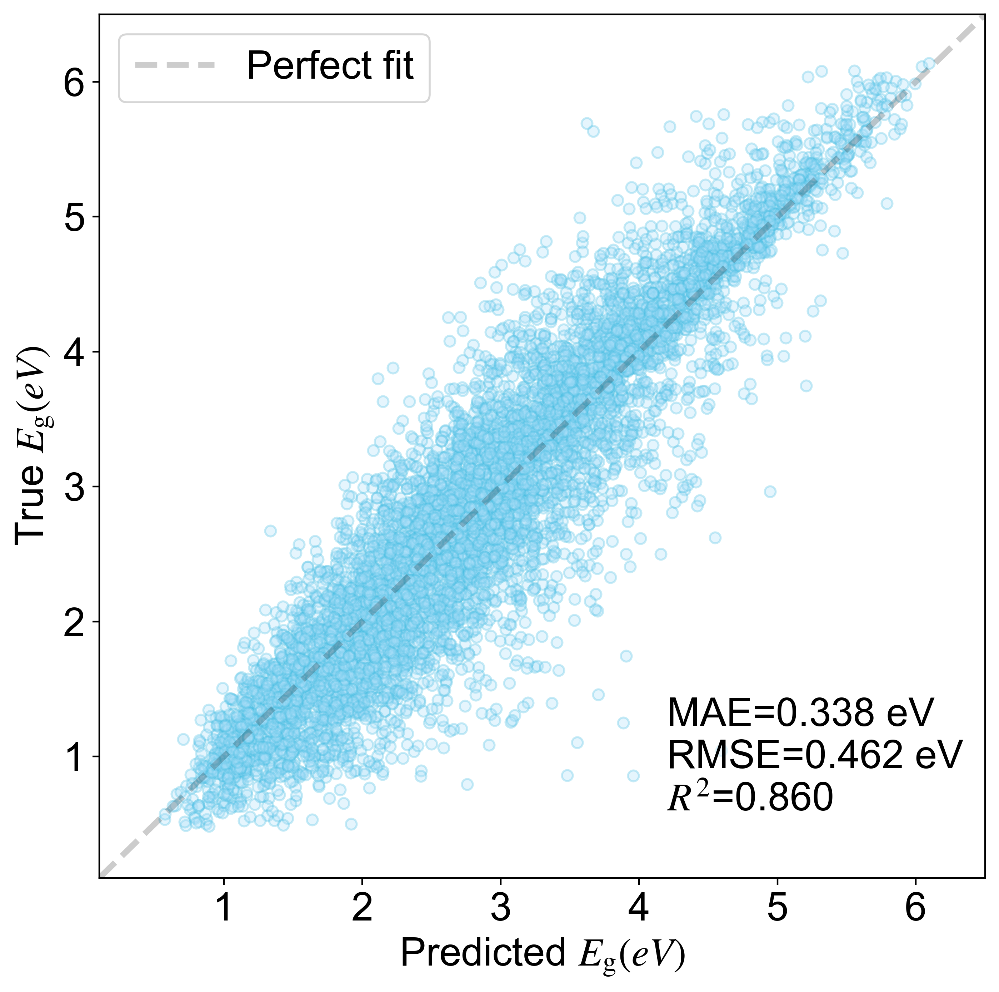

In [295]:
# 测试集效果图
from mpl_toolkits.axes_grid1 import make_axes_locatable
# sns.reset_orig()
fig,ax = plt.subplots(figsize=(8,8),facecolor="w")
# ax.scatter(y_pred,best_y_test,alpha = 0.2,s = 30, facecolor='#ffa970',edgecolor = '#dc2f02',linewidth = 1)
ax.scatter(y_pred,best_y_test,alpha = 0.3,s = 30, facecolor='#a9def9',edgecolor = '#48bfe3',linewidth = 1)
plt.xlim(0.1,6.5)
plt.ylim(0.1,6.5)
ax.plot([0.1, 6.5], [0.1, 6.5], linestyle='--', color='black',alpha = 0.2,lw=3,label='Perfect fit')

ax.legend(fontsize = 20)

model_result = "MAE=0.338 eV\nRMSE=0.462 eV\n$ R^{\mathrm{2}}$=0.860"
ax.text(4.2,0.6,model_result,fontsize=20,bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))

ax.set_xlabel('Predicted '+r'$E_{\mathrm{g}}(eV)$',fontsize = 20)
ax.set_ylabel('True '+ r'$E_{\mathrm{g}} (eV)$',fontsize = 20)

# Set aspect of the main Axes.


# create new Axes on the right and on the top of the current Axes
# divider = make_axes_locatable(ax)
# # below height and pad are in inches
# ax_histx = divider.append_axes("top", 1.2, pad=0.1, sharex=ax)
# ax_histy = divider.append_axes("right", 1.2, pad=0.1, sharey=ax)


# # make some labels invisible
ax_histx.xaxis.set_tick_params(labelbottom=False)
ax_histy.yaxis.set_tick_params(labelleft=False)

binwidth = 0.25
xymax = max(np.max(np.abs(y_pred)), np.max(np.abs(best_y_test)))
lim = (int(xymax/binwidth) + 1)*binwidth

# bins = np.arange(0, lim + binwidth, binwidth)
# ax_histx.hist(y_pred, bins=bins,color='#4895ef')
# ax_histy.hist(best_y_test, bins=bins, orientation='horizontal',color='#4895ef')


plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)

# ax_histx.set_ylabel('Sample Count')
# ax_histy.set_xlabel('Sample Count')

plt.savefig('原子描述符.png',dpi=400, bbox_inches='tight')

# plt.show()

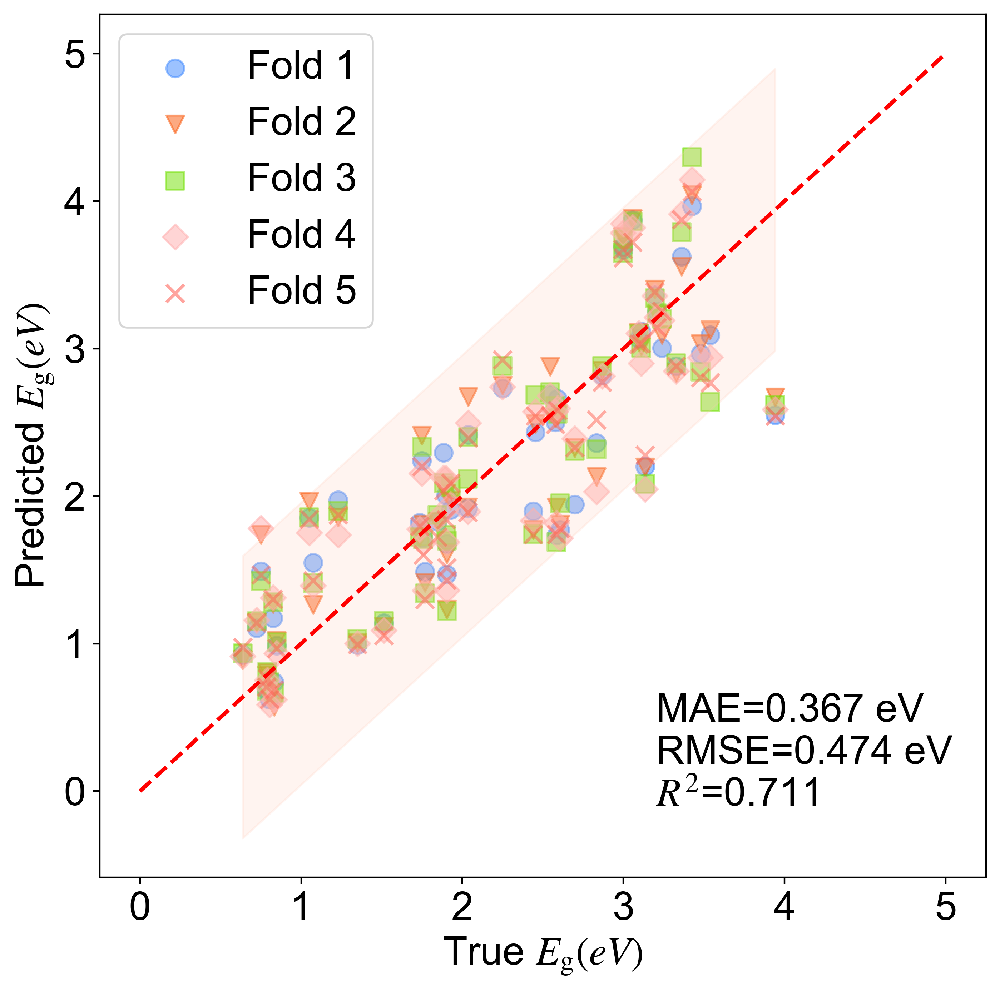

In [271]:
fig, ax = plt.subplots(figsize=(8,8),facecolor="w")
ax.scatter(y_eg_abo3, tmp_df['column_0'], facecolor='#3A86FF',s=80,  alpha=0.5,label = 'Fold 1')
ax.scatter(y_eg_abo3, tmp_df['column_1'], facecolor='#FB5607',s=80,  alpha=0.5, marker='v',label = 'Fold 2')
ax.scatter(y_eg_abo3, tmp_df['column_2'], facecolor='#70E000',s=80,  alpha=0.5, marker='s',label = 'Fold 3')
ax.scatter(y_eg_abo3, tmp_df['column_3'], facecolor='#FFADAD',s=80,  alpha=0.5, marker='D',label = 'Fold 4')
ax.scatter(y_eg_abo3, tmp_df['column_4'], facecolor='#FF4B3E',s=80,  alpha=0.5, marker='x',label = 'Fold 5')
ax.plot([0, 5], [0, 5],  'r--',lw=2)

y_pred_4_4 = tmp_df['column_4']
residuals = y_eg_abo3 - y_pred_4_4

plt.fill_between([y_eg_abo3.min(), y_eg_abo3.max()], np.array([y_eg_abo3.min(),y_eg_abo3.max()]) - 1.96 * residuals.std(), 
                 np.array([y_eg_abo3.min(),y_eg_abo3.max()]) + 1.96 * residuals.std(), alpha=0.2,color='#FFC9B5')

# plt.plot([y_eg_abo3.min(), y_eg_abo3.max()], np.array([y_eg_abo3.min(), y_eg_abo3.max()]) - 1.96 * residuals.std(), '-', color='grey',alpha=0.5)
# plt.plot([y_eg_abo3.min(), y_eg_abo3.max()], np.array([y_eg_abo3.min(), y_eg_abo3.max()]) + 1.96 * residuals.std(), '-', color='grey',alpha=0.5)
ax.legend(loc='upper left',fontsize = 20)
model_result = "MAE=0.367 eV\nRMSE=0.474 eV\n$ R^{\mathrm{2}}$=0.711"
ax.text(3.2,-0.1,model_result,fontsize=20,bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))
# ax.set_xlabel('Experimental '+r'$E_{\mathrm{g}}(eV)$')
# ax.set_ylabel('Predicted '+ r'$E_{\mathrm{g}} (eV)$')
ax.set_xlabel('True '+r'$E_{\mathrm{g}}(eV)$',fontsize=20)
ax.set_ylabel('Predicted '+ r'$E_{\mathrm{g}} (eV)$',fontsize=20)
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.savefig('小样本5折交叉.png',dpi=400, bbox_inches='tight')

In [95]:
error_data = pd.DataFrame(columns = ['formula','valid_Eg','pred_Eg'])
error_data['formula'] = base_metal_oxide['formula']
error_data['valid_Eg'] = base_metal_oxide['target']
error_data['pred_Eg'] = tmp_df['column_4']
error_data['diff'] = abs(error_data['valid_Eg'] - error_data['pred_Eg'])
error_data = error_data.sort_values(by='diff', ascending=False).reset_index(drop = True)
error_data

,formula,valid_Eg,pred_Eg,diff
0,BaCeO3,3.941353,2.542833,1.398520
1,TaAgO3,3.135210,2.277891,0.857319
2,TiPbO3,2.584444,1.739394,0.845050
3,NbAgO3,2.606289,1.781807,0.824482
4,InBiO3,1.050888,1.842796,0.791908
5,HfPbO3,3.538460,2.769142,0.769318
6,InSbO3,0.751440,1.467100,0.715660
7,CeBeO3,2.439456,1.740439,0.699017
8,GaBiO3,2.249296,2.925106,0.675811
9,DyInO3,2.996601,3.671910,0.675308


In [339]:
error_data.to_csv('atomic_errror.csv')

In [166]:
def get_latex_feature_names(data):
    name_dict = {"A_covalent Radius": r'$ A^{\mathrm{CR}}$',
                 'A_Density':r'$ A^{\mathrm{D}}$',
                 'B_Density':r'$ B^{\mathrm{D}}$',
                 'A_Period': r'$ A^{\mathrm{P}}$',
                 'B_Period': r'$ B^{\mathrm{P}}$',
                 'A_number of Valence Electrons':r'$ A^{\mathrm{VE}}$',
                 'B_number of Valence Electrons':r'$ B^{\mathrm{VE}}$',
                 'A_number of d Electrons':r'$ A^{\mathrm{d}}$',
                 'B_number of d Electrons':r'$ B^{\mathrm{d}}$',
                 'A_Electronegativity':r'$ A^{\mathrm{En}}$',
                 'B_Electronegativity':r'$ B^{\mathrm{En}}$',
                 'A_Mulliken EN':r'$ A^{\mathrm{MEn}}$',
                 'B_Mulliken EN':r'$ B^{\mathrm{MEn}}$',
                 'B_atomic Radius':r'$ B^{\mathrm{R}}$',
                'A_number of s+p Electrons': r'$ A^{\mathrm{s+p}}$',
                'B_number of s+p Electrons': r'$ B^{\mathrm{s+p}}$',
                 'A-B_Density':r'$ X_\mathrm{1}^{\mathrm{D}}$',
                '(A+B)-O_Density': r'$ X_\mathrm{2}^{\mathrm{D}}$',
                 '(A+B)-O_covalent Radius':r'$ X_\mathrm{2}^{\mathrm{CR}}$',
                 'A-B_covalent Radius':r'$ X_\mathrm{1}^{\mathrm{CR}}$',
                 '(A+B)-O_number of Valence Electrons':r'$ X_\mathrm{2}^{\mathrm{VE}}$',
                 'A-B_Electronegativity':r'$ X_\mathrm{1}^{\mathrm{En}}$',
                 'A-B_number of Valence Electrons':r'$ X_\mathrm{1}^{\mathrm{VE}}$',
                 'A-B_number':r'$ X_\mathrm{1}^{\mathrm{N}}$',
                 '(A+B)-O_Electronegativity':r'$ X_\mathrm{2}^{\mathrm{En}}$',
                 'A-B_number of d Electrons':r'$X_\mathrm{1}^{\mathrm{d}}$',
                 'A-B_number of s+p Electrons':r'$ X_\mathrm{1}^{\mathrm{s+p}}$',
                 '(A+B)-O_number of s+p Electrons':r'$ X_\mathrm{2}^{\mathrm{s+p}}$',
                 '(A+B)-O_number of d Electrons':r'$ X_\mathrm{2}^{\mathrm{d}}$',
                 '(A+B)-O_Period':r'$ X_\mathrm{2}^{\mathrm{P}}$',
                 'A-B_FirstIonization':r'$ X_\mathrm{2}^{\mathrm{FI}}$',
                 'B_atomic_hfomo':r'$ B^{\mathrm{hfomo}}$',
                 'B_atomic_lpumo':r'$ B^{\mathrm{lpumo}}$',
                 'B_atomic_r_val_neg_1':r'$ B_\mathrm{-1}^{\mathrm{Rval}}$',
                 'A_atomic_ndval':r'$ A^{\mathrm{ndval}}$',
                 'B_atomic_npval':r'$ B^{\mathrm{npval}}$',
                 'A_atomic_nunf':r'$ A^{\mathrm{nunf}}$',
                 'A_atomic_nfunf':r'$ A^{\mathrm{nfunf}}$',
                 'B_atomic_r_val_05':r'$ B_\mathrm{05}^{\mathrm{Rval}}$',
                 'B_atomic_ndval':r'$ B^{\mathrm{ndval}}$',
                 'A_atomic_r_val':r'$ A^{\mathrm{Rval}}$',
                 'A_atomic_nfval':r'$ A^{\mathrm{nfval}}$',
                 'A_atomic_ea':r'$ A^{\mathrm{EA}}$',
                 'A_atomic_lfumo':r'$ A^{\mathrm{lfumo}}$',
                 'A_atomic_r_d_1':r'$ A_\mathrm{1}^{\mathrm{Rd}}$',
                 'A_atomic_r_val_1':r'$ A_\mathrm{1}^{\mathrm{Rval}}$'
                }
    element_dict = {}
    for name in data.columns:
        if '_' not in name and len(name)<=2 :
            element_dict[name] = fr'${name}$'
    name_dict.update(element_dict)
    data = data.rename(columns=name_dict)
    return data

In [167]:
best_X_train = get_latex_feature_names(best_X_train)
best_X_test = get_latex_feature_names(best_X_test)

In [168]:
best_X_train.columns

Index(['$ B^{\mathrm{VE}}$', '$ X_\mathrm{2}^{\mathrm{d}}$',
       '$ B^{\mathrm{hfomo}}$', '$ B^{\mathrm{lpumo}}$',
       '$ B_\mathrm{-1}^{\mathrm{Rval}}$', '$ X_\mathrm{1}^{\mathrm{VE}}$',
       '$ B^{\mathrm{R}}$', '$ A^{\mathrm{ndval}}$', '$ A^{\mathrm{nunf}}$',
       '$ B_\mathrm{05}^{\mathrm{Rval}}$', '$ B^{\mathrm{ndval}}$',
       '$ B^{\mathrm{npval}}$', '$ A^{\mathrm{Rval}}$',
       '$ A^{\mathrm{nfunf}}$', '$ A^{\mathrm{Rval}}$', '$ A^{\mathrm{EA}}$',
       'A-B_atomic Radius', '$ A^{\mathrm{s+p}}$', '$ A^{\mathrm{nfval}}$',
       '$ A^{\mathrm{lfumo}}$', '$ A^{\mathrm{CR}}$', 'A_atomic_lpumo',
       'A_atomic_r_s_1', 'A_atomic_hpomo', '$ A^{\mathrm{Rd}}$'],
      dtype='object')

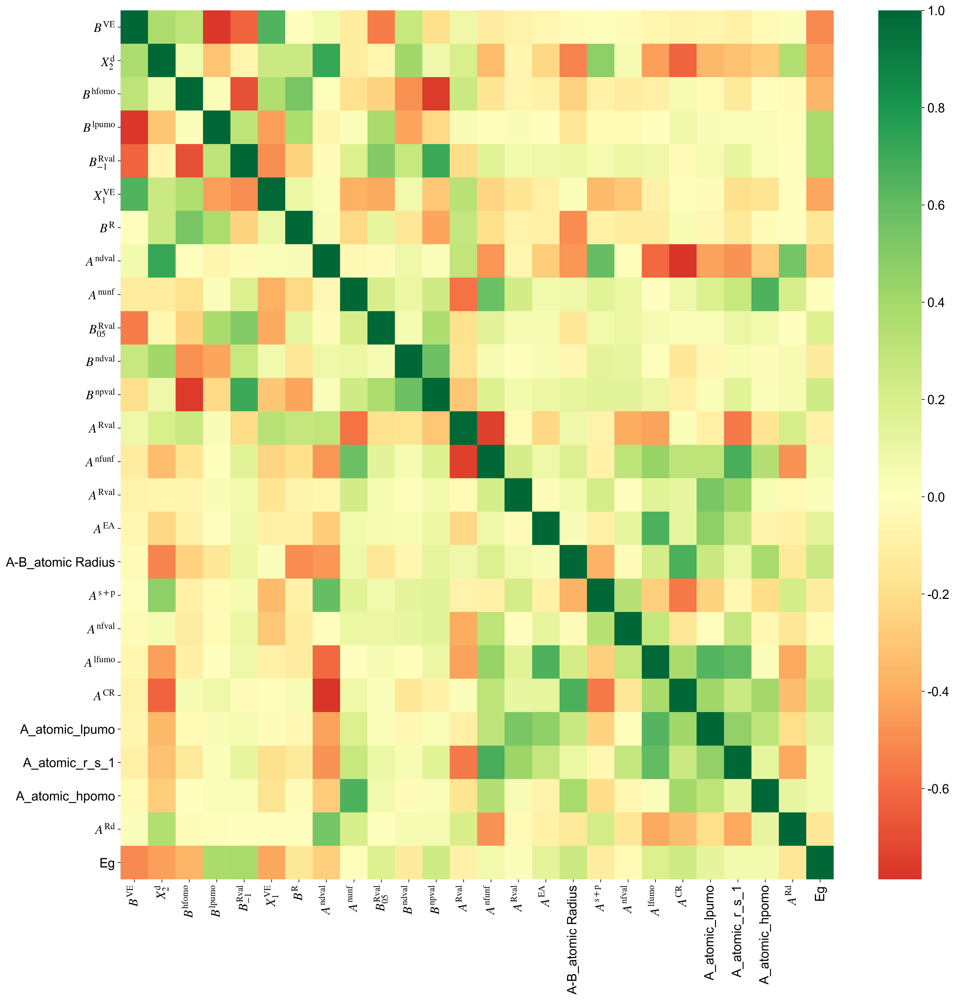

In [169]:
plt.figure(figsize=(20,20), dpi= 300)
sns.heatmap(pd.concat([best_X_train,best_y_train],axis=1).corr(method='spearman' ,min_periods=1), 
            cmap='RdYlGn', center=0, annot=False)
plt.show()

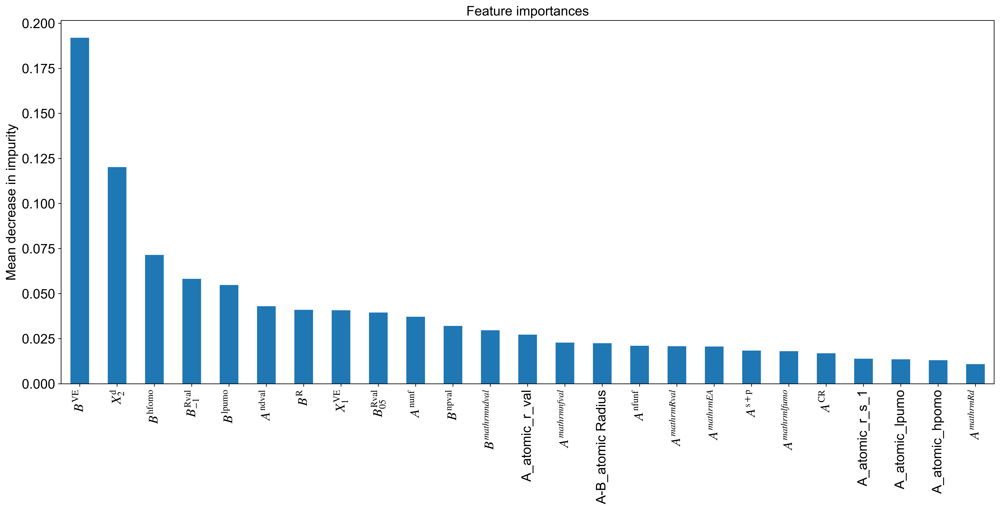

In [148]:
importances = model_4.feature_importances_
# visualization
feat_with_importance = pd.Series(importances, best_X_train.columns)
feat_with_importance_sort = feat_with_importance.sort_values(ascending=False)
fig, ax = plt.subplots(figsize=(20,8))
feat_with_importance_sort.plot.bar(ax=ax )
ax.set_title("Feature importances")
ax.set_ylabel("Mean decrease in impurity")
plt.show()

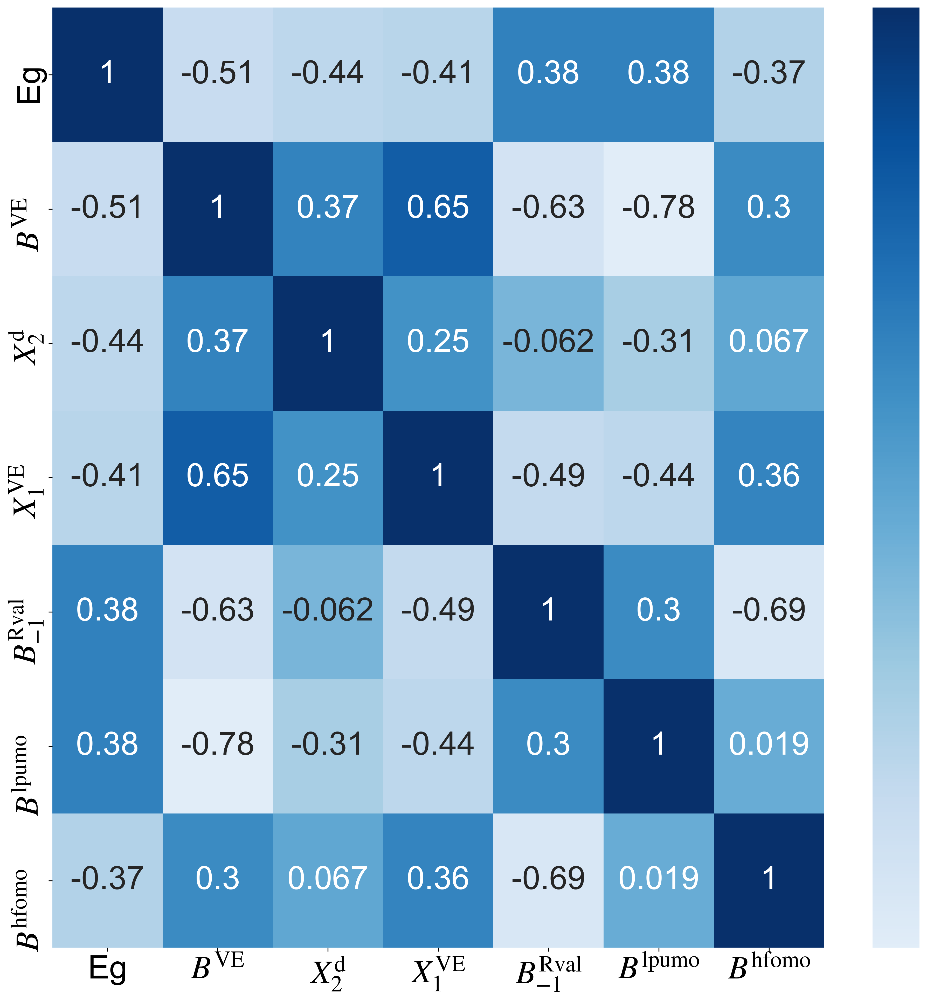

In [294]:
plt.figure(figsize=(16,16), dpi= 300)
corr = pd.concat([best_X_train,best_y_train],axis=1).corr(method='spearman' ,min_periods=1)
tmp = np.abs(corr['Eg'])
to_plot = tmp.sort_values(ascending=False)[0:7]
sns.heatmap(corr.loc[to_plot.index,to_plot.index], cmap='Blues',annot_kws={"size": 30}, center=0, annot=True, cbar_kws={"ticks": []})
plt.tick_params(axis='both', labelsize=30)
plt.savefig('相关性.png',dpi=400, bbox_inches='tight')
plt.show()

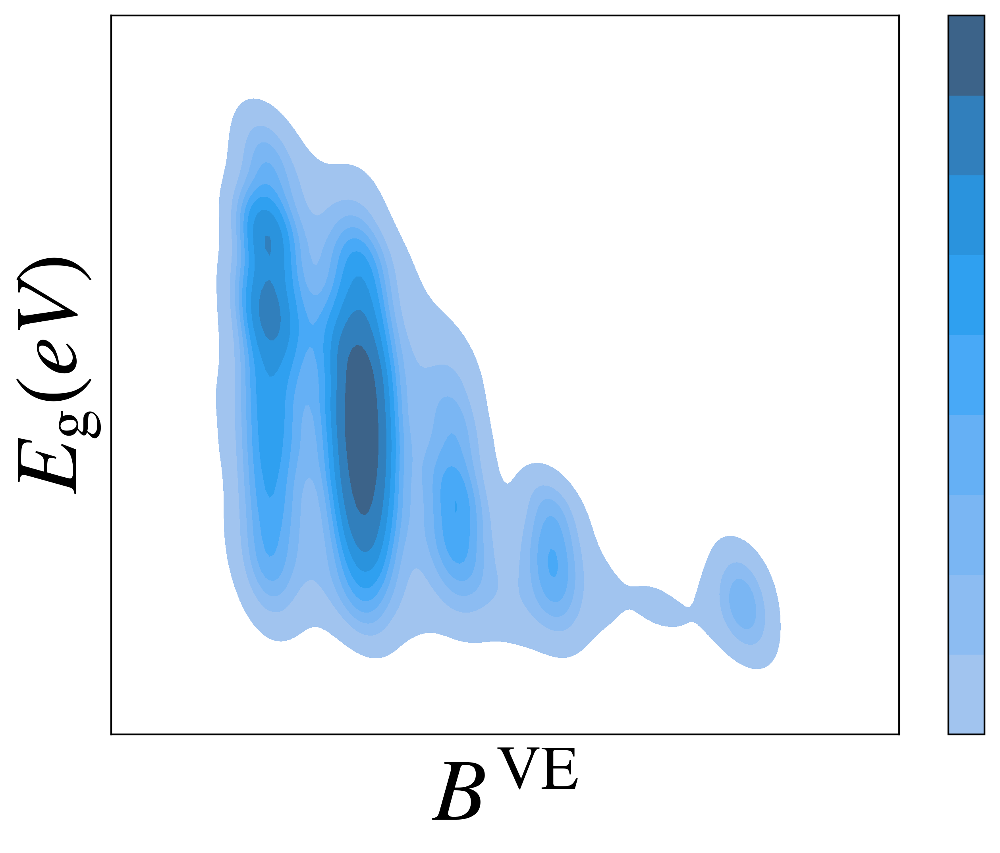

In [287]:
x=best_X_train[to_plot.index[1]]
sns.kdeplot(x=x, y=best_y_train, fill=True, cbar=True,cbar_kws=dict(ticks=[]))
plt.ylabel('$E_{\mathrm{g}}(eV)$',fontsize = 40)
plt.xlabel('$ B^{\mathrm{VE}}$',fontsize=40,labelpad=10)
plt.xticks([])
plt.yticks([])
plt.tick_params(axis='x', which='both', bottom=False, labelbottom=False)
plt.savefig('Bve.png',dpi=400, bbox_inches='tight')

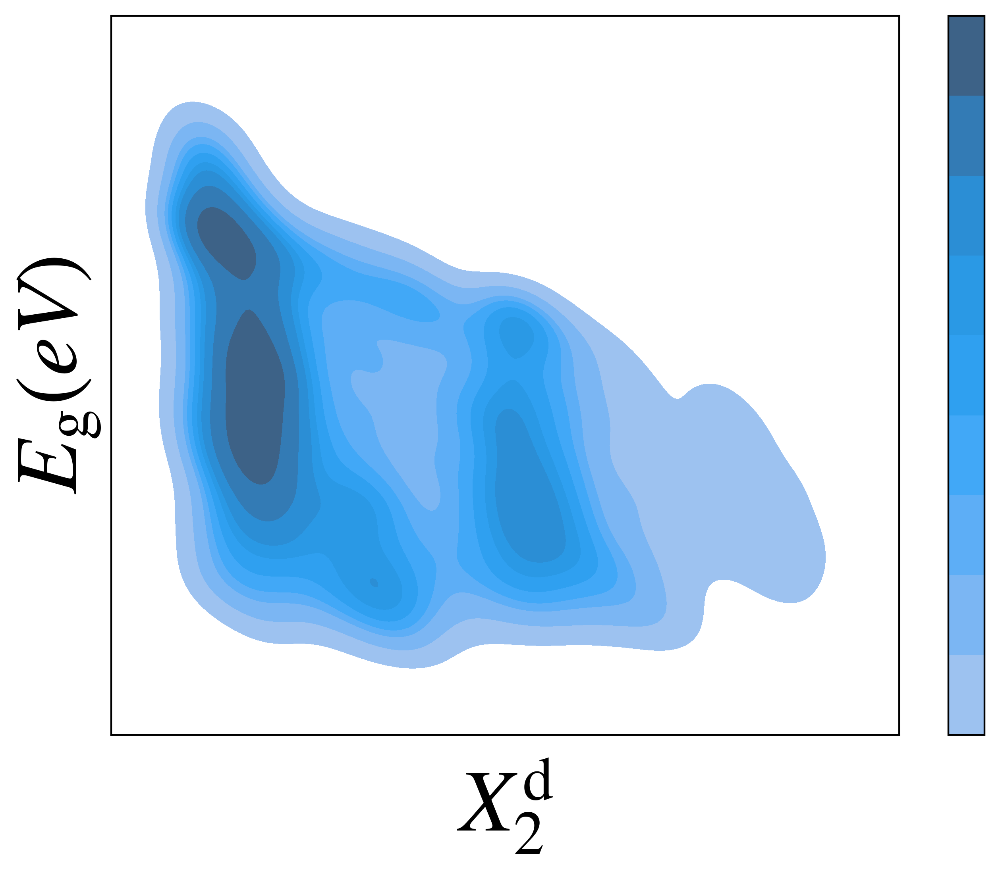

In [288]:
x=best_X_train[to_plot.index[2]]
sns.kdeplot(x=x, y=best_y_train, fill=True, cbar=True,cbar_kws=dict(ticks=[]))
plt.ylabel('$E_{\mathrm{g}}(eV)$',fontsize = 40)
plt.xlabel('$ X_\mathrm{2}^{\mathrm{d}}$',fontsize=40,labelpad=10)
plt.xticks([])
plt.yticks([])
plt.tick_params(axis='x', which='both', bottom=False, labelbottom=False)
plt.savefig('X2d.png',dpi=400, bbox_inches='tight')

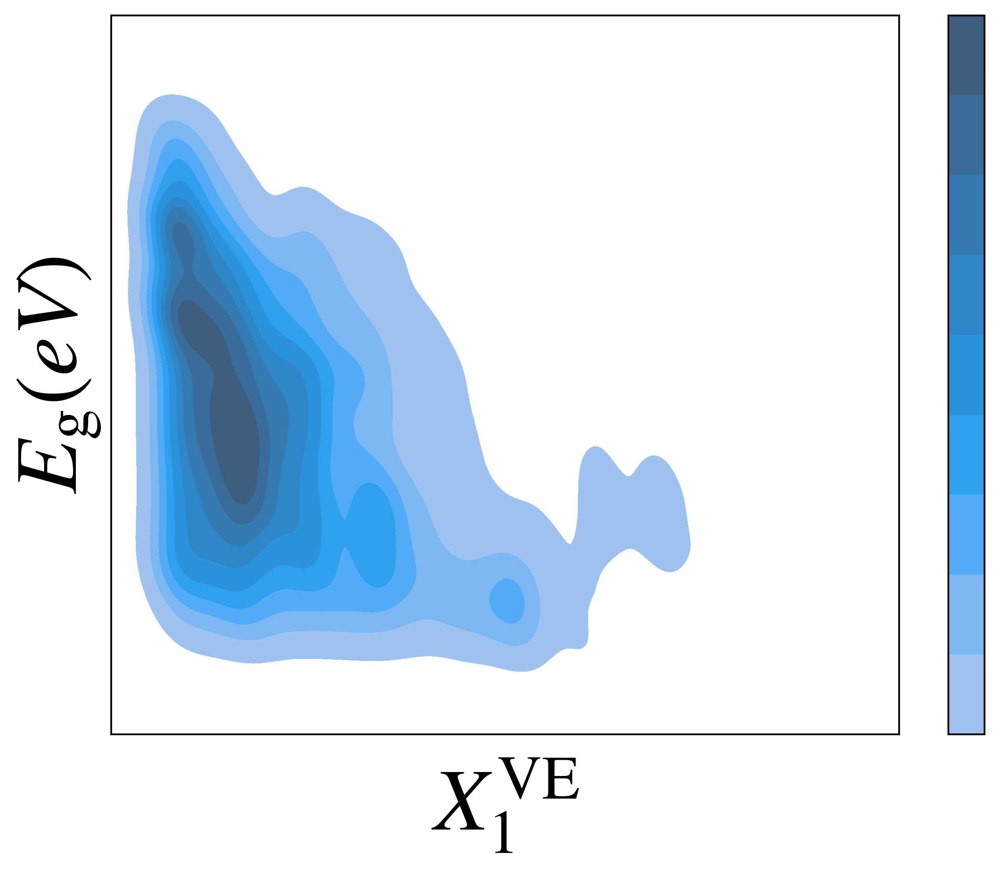

In [289]:
x=best_X_train[to_plot.index[3]]
sns.kdeplot(x=x, y=best_y_train, fill=True, cbar=True,cbar_kws=dict(ticks=[]))
plt.ylabel('$E_{\mathrm{g}}(eV)$',fontsize = 40)
plt.xlabel('$ X_\mathrm{1}^{\mathrm{VE}}$',fontsize=40,labelpad=10)
plt.xticks([])
plt.yticks([])
plt.tick_params(axis='x', which='both', bottom=False, labelbottom=False)
plt.savefig('X1ve.png',dpi=400, bbox_inches='tight')

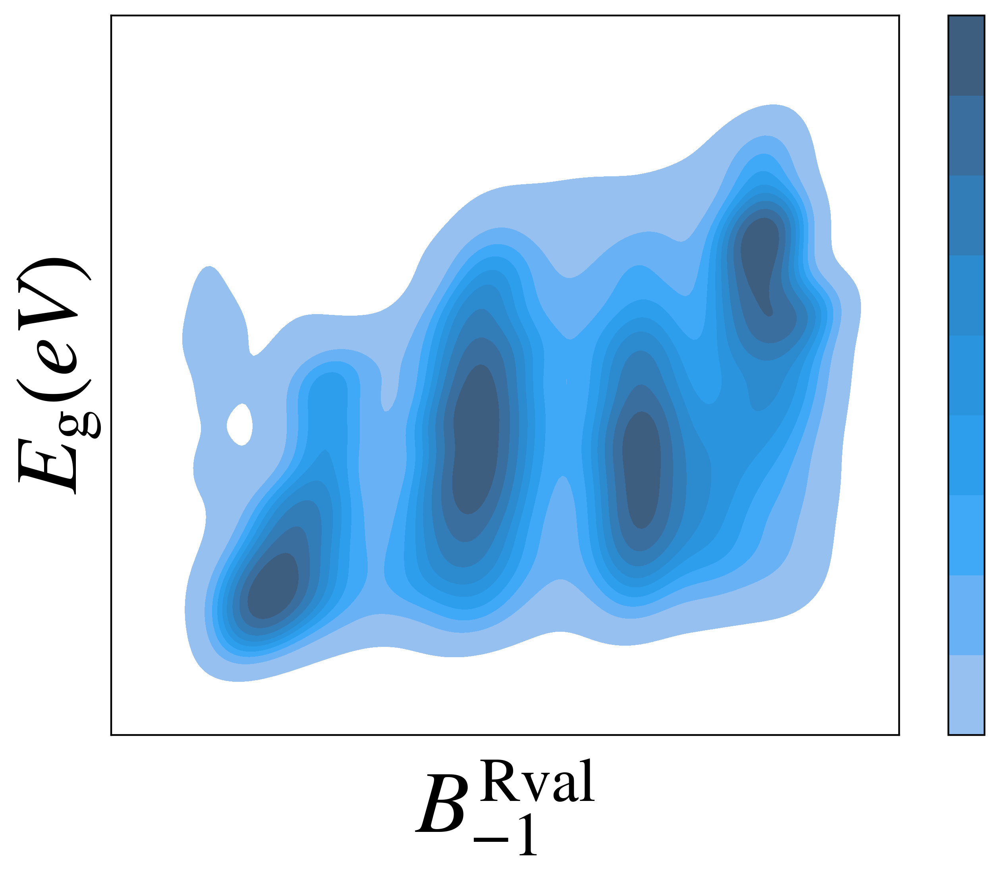

In [290]:
x=best_X_train[to_plot.index[4]]
sns.kdeplot(x=x, y=best_y_train, fill=True, cbar=True,cbar_kws=dict(ticks=[]))
plt.ylabel('$E_{\mathrm{g}}(eV)$',fontsize = 40)
plt.xlabel( '$ B_\mathrm{-1}^{\mathrm{Rval}}$',fontsize=40,labelpad=10)
plt.xticks([])
plt.yticks([])
plt.tick_params(axis='x', which='both', bottom=False, labelbottom=False)
plt.savefig('B1Rval.png',dpi=400, bbox_inches='tight')

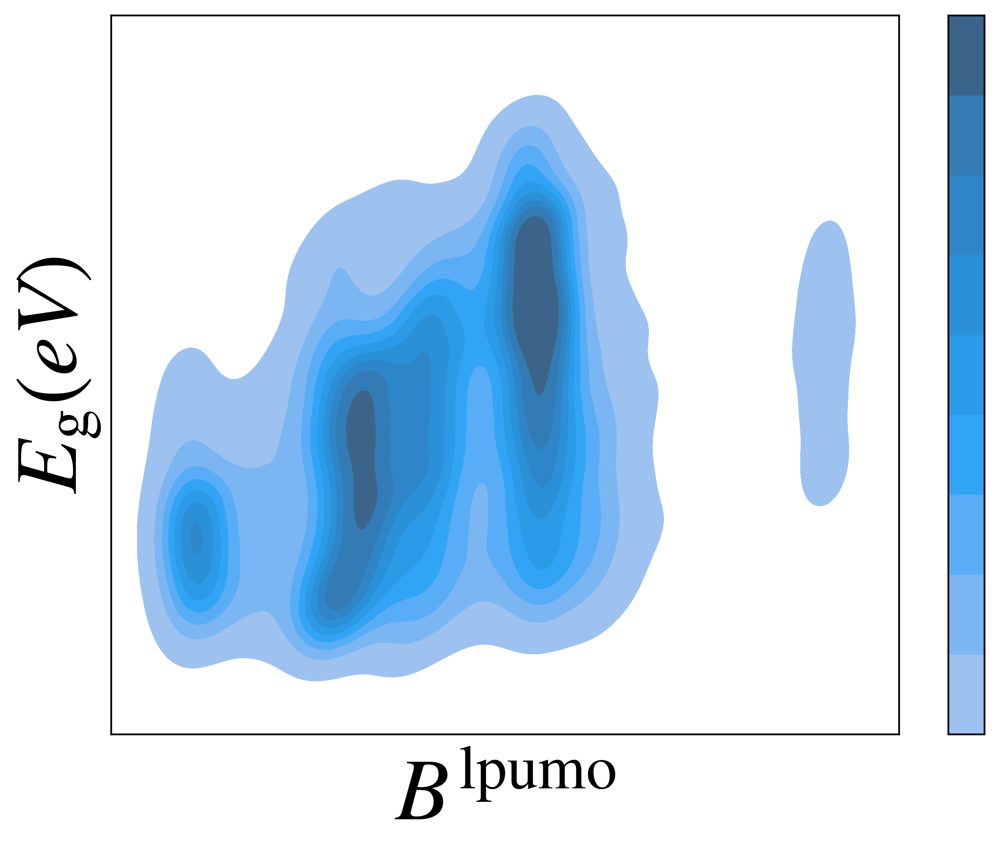

In [291]:
x=best_X_train[to_plot.index[5]]
sns.kdeplot(x=x, y=best_y_train, fill=True, cbar=True,cbar_kws=dict(ticks=[]))
plt.ylabel('$E_{\mathrm{g}}(eV)$',fontsize = 40)
plt.xlabel('$ B^{\mathrm{lpumo}}$',fontsize=40,labelpad=10)
plt.xticks([])
plt.yticks([])
plt.tick_params(axis='x', which='both', bottom=False, labelbottom=False)
plt.savefig('Blpumo.png',dpi=400, bbox_inches='tight')

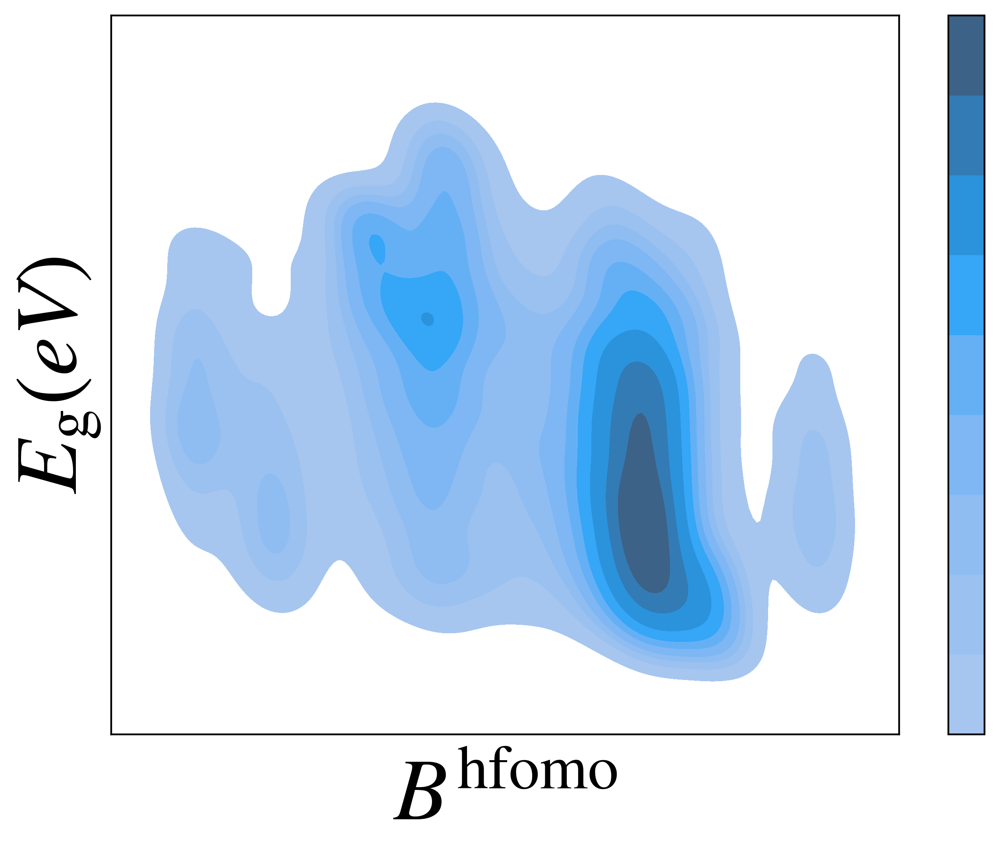

In [292]:
x=best_X_train[to_plot.index[6]]
sns.kdeplot(x=x, y=best_y_train, fill=True, cbar=True,cbar_kws=dict(ticks=[]))
plt.ylabel('$E_{\mathrm{g}}(eV)$',fontsize = 40)
plt.xlabel( '$ B^{\mathrm{hfomo}}$',fontsize=40,labelpad=10)
plt.xticks([])
plt.yticks([])
plt.tick_params(axis='x', which='both', bottom=False, labelbottom=False)
plt.savefig('Bhfmo.png',dpi=400, bbox_inches='tight')

In [170]:
import shap
from concurrent.futures import ThreadPoolExecutor, as_completed
explainer = shap.TreeExplainer(model_4)
test = best_X_test.sample(2000)

In [171]:
shap_values = explainer.shap_values(test)

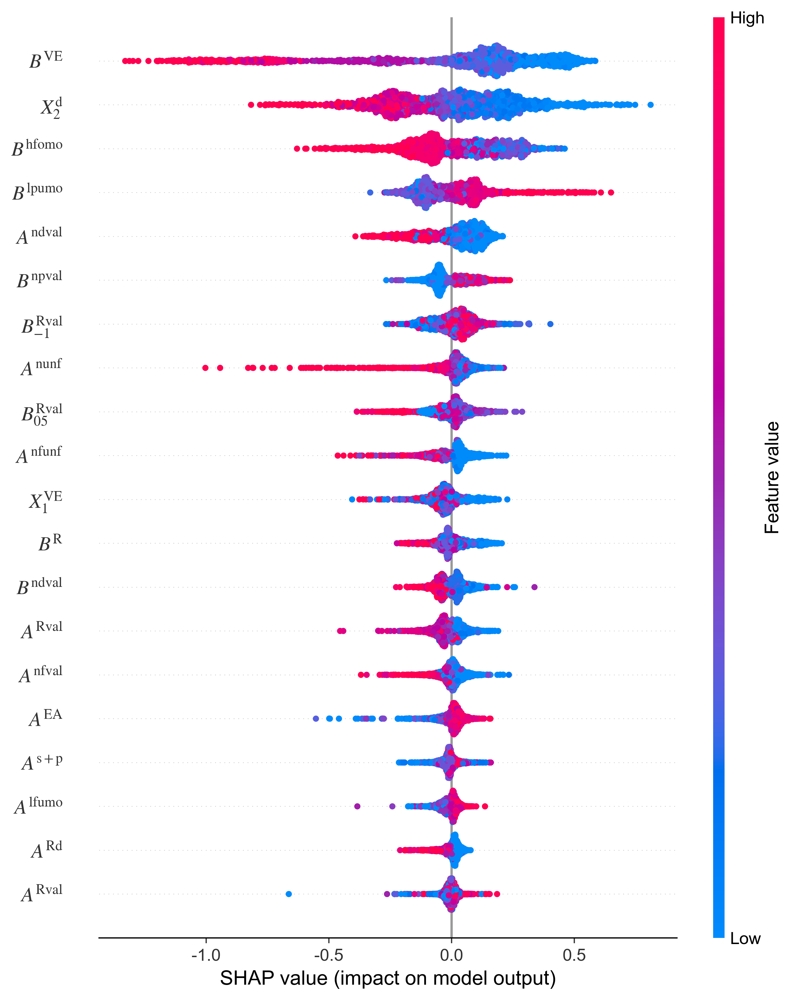

In [172]:
shap.summary_plot(shap_values = shap_values, features=test) 

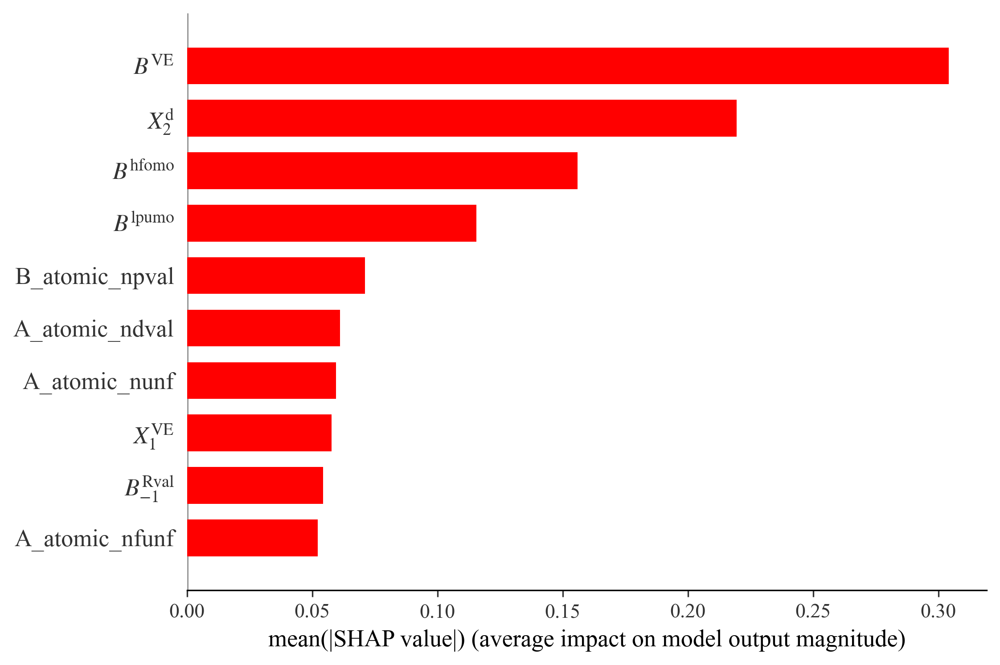

In [201]:
shap.summary_plot(shap_values, test, plot_type="bar", color='r',max_display=10)

In [219]:
import matplotlib.pyplot as plt
import numpy as np

# 创建主图
fig, ax1 = plt.subplots(figsize=(10, 8), dpi=1200)


# 在主图上绘制蜂巢图（不显示颜色条）
shap.summary_plot(
    shap_values, 
    test,
    feature_names=test.columns,
    plot_type="dot",
    show=False,
    color_bar=True,
)
ax1.tick_params(axis='x', labelsize=15)   # 底部X轴刻度字体大小
ax1.tick_params(axis='y', labelsize=19) 

# 调整主图位置（左侧留出空间给特征名称，右侧留出空间给颜色条）
ax1.set_position([0.25, 0.2, 0.55, 0.65])

# 创建共享y轴的顶部x轴
ax2 = ax1.twiny()

# 在顶部轴上绘制特征贡献条形图
plt.sca(ax2)  # 切换到ax2进行绘制
shap.summary_plot(
    shap_values,
    test,
    plot_type="bar",
    show=False,
)
ax2.tick_params(axis='x', labelsize=15)
# 在蜂巢图的y=9位置添加横线（分隔前10个特征）
ax1.axhline(y=8.5, color='gray', linestyle='--', linewidth=1, alpha=0.8)  # 调整位置到特征之间

# 设置条形图透明度
for bar in ax2.patches:
    bar.set_alpha(0.3)

# 调整坐标轴标签
ax1.set_xlabel('SHAP Value Impact (Beeswarm)', fontsize=15)
ax2.set_xlabel('Mean |SHAP Value| (Importance)', fontsize=15)

# 将顶部轴的标签和刻度移至上方
ax2.xaxis.set_label_position('top')
ax2.xaxis.tick_top()

# 微调布局并保存
plt.tight_layout()
plt.savefig("shap_summary.png", format='png', bbox_inches='tight')
plt.show()